In [2]:
!pip install kaggle

  Using cached kaggle-1.5.12-py3-none-any.whl
  Using cached python_slugify-4.0.1-py2.py3-none-any.whl
  Using cached tqdm-4.59.0-py2.py3-none-any.whl (74 kB)
  Using cached text_unidecode-1.3-py2.py3-none-any.whl (78 kB)


In [3]:
!kaggle competitions download -c rossmann-store-sales

 86%|████████████████████████████████▌     | 6.00M/6.99M [00:00<00:00, 59.1MB/s]
100%|██████████████████████████████████████| 6.99M/6.99M [00:00<00:00, 63.8MB/s]


In [6]:
!unzip rossman-store/rossmann-store-sales.zip rossman-store/

Archive:  rossman-store/rossmann-store-sales.zip
  inflating: sample_submission.csv   
  inflating: store.csv               
  inflating: test.csv                
  inflating: train.csv               


In [2]:
#https://www.kaggle.com/danspace/rossmann-store-sales-xgboost
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

Matplotlib is building the font cache; this may take a moment.


In [3]:
store = pd.read_csv("store.csv")
train = pd.read_csv("train.csv",parse_dates=[2])
test = pd.read_csv("test.csv",parse_dates=[3])

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3072: DtypeWarning: Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


### Exploratory data analysis

In [4]:
store.head()

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


In [5]:
# check store nan rows
store.isnull().sum()

Store                          0
StoreType                      0
Assortment                     0
CompetitionDistance            3
CompetitionOpenSinceMonth    354
CompetitionOpenSinceYear     354
Promo2                         0
Promo2SinceWeek              544
Promo2SinceYear              544
PromoInterval                544
dtype: int64

In [6]:
# fillna in store with 0 has better result than median()
store.fillna(0, inplace=True)

In [7]:
train.head().append(train.tail())

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1
1017204,1111,2,2013-01-01,0,0,0,0,a,1
1017205,1112,2,2013-01-01,0,0,0,0,a,1
1017206,1113,2,2013-01-01,0,0,0,0,a,1
1017207,1114,2,2013-01-01,0,0,0,0,a,1
1017208,1115,2,2013-01-01,0,0,0,0,a,1


In [8]:
train.isnull().sum()

Store            0
DayOfWeek        0
Date             0
Sales            0
Customers        0
Open             0
Promo            0
StateHoliday     0
SchoolHoliday    0
dtype: int64

In [9]:
train.Open.value_counts()

1    844392
0    172817
Name: Open, dtype: int64

In [14]:
np.sum([train['Sales'] == 0])

172871

Text(0.5, 1.0, 'Store Daily Open Countplot')

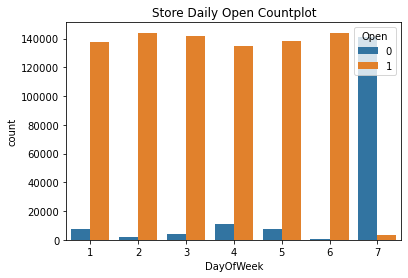

In [11]:
sns.countplot(x = 'DayOfWeek', hue = 'Open', data = train)
plt.title('Store Daily Open Countplot')

Closed on a few weekdays (probably holiday) and almost all sundays, lets check the sum of sales per day of week

<AxesSubplot:xlabel='DayOfWeek', ylabel='Sales'>

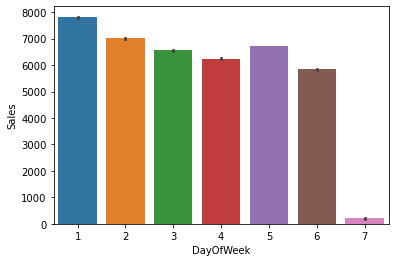

In [12]:
sns.barplot(x='DayOfWeek', y='Sales', data=train)

It make sense, right? Stores are mostly closed on sundays, so (almost) no sales on sundays

In [15]:
# fill missing values in test with 1
test.fillna(value = 1, inplace = True)

In [16]:
# merge data with store 
train = pd.merge(train, store, on='Store')
test = pd.merge(test, store, on='Store')

# split the last 6 weeks data as hold-out set (idea from Gert https://www.kaggle.com/c/rossmann-store-sales/discussion/18024)
train = train.sort_values(['Date'],ascending = False)
train_total = train.copy()

split_index = 6*7*1115 # 6 weeks for 1115 different stores
valid = train[:split_index] 
train = train[split_index:]

# only use data of Sales>0 and Open is 1
valid = valid[(valid.Open != 0)&(valid.Sales >0)]
train = train[(train.Open != 0)&(train.Sales >0)]
train_total = train_total[(train_total.Open != 0)&(train_total.Sales >0)]

Text(0.5, 1.0, 'LogSales')

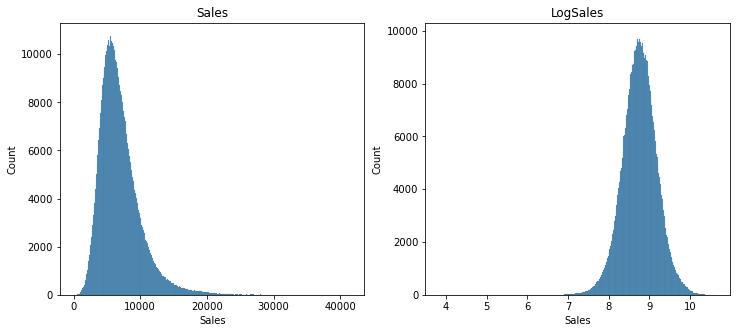

In [17]:
f, ((ax1), (ax2)) = plt.subplots(1,2, figsize=(12,5))
sns.histplot(train_total['Sales'], ax=ax1)
ax1.set_title('Sales')
sns.histplot(np.log(train_total['Sales']), ax=ax2)
ax2.set_title('LogSales')

### Feature engineering

In [18]:
# process train and test
def process(data, isTest = False):
    # label encode some features
    mappings = {'0':0, 'a':1, 'b':2, 'c':3, 'd':4}
    data.StoreType.replace(mappings, inplace=True)
    data.Assortment.replace(mappings, inplace=True)
    data.StateHoliday.replace(mappings, inplace=True)
    
    # extract some features from date column  
    data['Month'] = data.Date.dt.month
    data['Year'] = data.Date.dt.year
    data['Day'] = data.Date.dt.day
    data['WeekOfYear'] = data.Date.dt.weekofyear
    
    # calculate competiter open time in months
    data['CompetitionOpen'] = 12 * (data.Year - data.CompetitionOpenSinceYear) + \
        (data.Month - data.CompetitionOpenSinceMonth)
    data['CompetitionOpen'] = data['CompetitionOpen'].apply(lambda x: x if x > 0 else 0)
    
#     # calculate promo2 open time in months
    data['PromoOpen'] = 12 * (data.Year - data.Promo2SinceYear) + \
        (data.WeekOfYear - data.Promo2SinceWeek) / 4.0
    data['PromoOpen'] = data['PromoOpen'].apply(lambda x: x if x > 0 else 0)
                                                 
#     # Indicate whether the month is in promo interval
    month2str = {1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun', \
             7:'Jul', 8:'Aug', 9:'Sept', 10:'Oct', 11:'Nov', 12:'Dec'}
    data['month_str'] = data.Month.map(month2str)

    def check(row):
        if isinstance(row['PromoInterval'],str) and row['month_str'] in row['PromoInterval']:
            return 1
        else:
            return 0
        
    data['IsPromoMonth'] =  data.apply(lambda row: check(row),axis=1)    
    
    # select the features we need
    features = ['Store', 'DayOfWeek', 'Promo', 'StateHoliday', 'SchoolHoliday',
       'StoreType', 'Assortment', 'CompetitionDistance',
       'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Promo2',
       'Promo2SinceWeek', 'Promo2SinceYear', 'Year', 'Month', 'Day',
       'WeekOfYear', 'CompetitionOpen', 'PromoOpen', 'IsPromoMonth']  
    if not isTest:
        features.append('Sales')
        
    data = data[features]
    return data

train = process(train)
valid = process(valid)
train_total = process(train_total)
x_test = process(test,isTest = True)

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:13: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.


In [20]:
# sort by index
valid.sort_index(inplace = True)
train.sort_index(inplace = True)
train_total.sort_index(inplace = True)

# split x and y
x_train, y_train = train.drop(columns = ['Sales']), np.log1p(train['Sales'])
x_valid, y_valid = valid.drop(columns = ['Sales']), np.log1p(valid['Sales'])
x_train_total, y_train_total = train_total.drop(columns = ['Sales']), np.log1p(train_total['Sales'])

In [21]:
x_train.head()

,Store,DayOfWeek,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,Year,Month,Day,WeekOfYear,CompetitionOpen,PromoOpen,IsPromoMonth
42,1,5,1,0,0,3,1,1270.0,9.0,2008.0,0,0.0,0.0,2015,6,19,25,81.0,24186.25,0
43,1,4,1,0,0,3,1,1270.0,9.0,2008.0,0,0.0,0.0,2015,6,18,25,81.0,24186.25,0
44,1,3,1,0,0,3,1,1270.0,9.0,2008.0,0,0.0,0.0,2015,6,17,25,81.0,24186.25,0
45,1,2,1,0,0,3,1,1270.0,9.0,2008.0,0,0.0,0.0,2015,6,16,25,81.0,24186.25,0
46,1,1,1,0,0,3,1,1270.0,9.0,2008.0,0,0.0,0.0,2015,6,15,25,81.0,24186.25,0


In [22]:
# define eval metrics
def rmspe(y, yhat):
    return np.sqrt(np.mean((yhat/y-1) ** 2))

def rmspe_xg(yhat, y):
    y = np.expm1(y.get_label())
    yhat = np.expm1(yhat)
    return "rmspe", rmspe(y,yhat)

Done with Feature Engineering, lets quickly check the feature importance using a RandomForestRegressor

In [23]:
# try random forest
from sklearn.ensemble import RandomForestRegressor

clf = RandomForestRegressor(n_estimators = 15)
clf.fit(x_train, y_train)
# validation
y_pred = clf.predict(x_valid)
error = rmspe(np.expm1(y_valid), np.expm1(y_pred))
print('RMSPE: {:.4f}'.format(error))

RMSPE: 0.1628


Text(0.5, 1.0, 'Feature Importance')

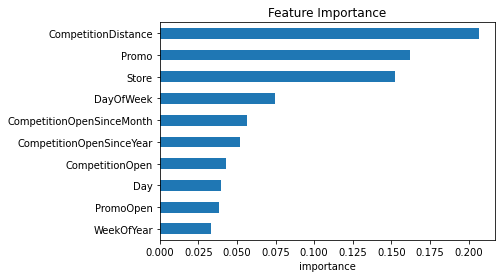

In [24]:
# plot feature importance for random forest model, show top 10 features
feat_importances = pd.Series(clf.feature_importances_, index=x_train.columns)
feat_importances.nlargest(10).sort_values(ascending = True).plot(kind='barh')
plt.xlabel('importance')
plt.title('Feature Importance')

In [25]:
import sagemaker
from sagemaker import get_execution_role
import boto3

region = boto3.Session().region_name
session = sagemaker.Session()

role = get_execution_role()
bucket = session.default_bucket()

In [26]:
# put the Sales column to first so XGBoost can work =)
cols = train.columns.tolist()
cols = cols[-1:] + cols[:-1]
train = train[cols]
valid = valid[cols]
train.head()

,Sales,Store,DayOfWeek,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,...,Promo2,Promo2SinceWeek,Promo2SinceYear,Year,Month,Day,WeekOfYear,CompetitionOpen,PromoOpen,IsPromoMonth
42,4202,1,5,1,0,0,3,1,1270.0,9.0,...,0,0.0,0.0,2015,6,19,25,81.0,24186.25,0
43,4645,1,4,1,0,0,3,1,1270.0,9.0,...,0,0.0,0.0,2015,6,18,25,81.0,24186.25,0
44,4000,1,3,1,0,0,3,1,1270.0,9.0,...,0,0.0,0.0,2015,6,17,25,81.0,24186.25,0
45,4852,1,2,1,0,0,3,1,1270.0,9.0,...,0,0.0,0.0,2015,6,16,25,81.0,24186.25,0
46,5518,1,1,1,0,0,3,1,1270.0,9.0,...,0,0.0,0.0,2015,6,15,25,81.0,24186.25,0


Preparing data and sending to s3

In [29]:
train_xgb = train.copy()
train_xgb['Sales'] = np.log1p(train_xgb['Sales'])

valid_xgb = valid.copy()
valid_xgb['Sales'] = np.log1p(valid_xgb['Sales'])

prefix = 'sagemaker/rossmann-store/xgboost'
train_file = 'df_train.csv';
train_xgb.to_csv(train_file, index=False, header=False)
train_data_s3_path = session.upload_data(path=train_file, key_prefix=prefix + "/train")
print('Train data uploaded to: ' + train_data_s3_path)

test_file = 'df_test.csv';
valid_xgb.to_csv(test_file, index=False, header=False)
test_data_s3_path = session.upload_data(path=test_file, key_prefix=prefix + "/test")
print('Test data uploaded to: ' + test_data_s3_path)

Train data uploaded to: s3://sagemaker-us-east-1-475414269301/sagemaker/rossmann-store/xgboost/train/df_train.csv
Test data uploaded to: s3://sagemaker-us-east-1-475414269301/sagemaker/rossmann-store/xgboost/test/df_test.csv


### Preparing the estimator

In [30]:
# initialize hyperparameters
hyperparameters = {"objective": "reg:linear", # for linear regression
          "booster" : "gbtree",   # use tree based models 
          "eta": 0.03,   # learning rate
          "max_depth": 10,    # maximum depth of a tree
          "subsample": 0.9,    # Subsample ratio of the training instances
          "colsample_bytree": 0.7,   # Subsample ratio of columns when constructing each tree
          "silent": 1,   # silent mode
          "seed": 10,   # Random number seed
          "num_round":"3000"}


output_path = 's3://{}/{}/{}/output'.format(bucket, prefix, 'model-output')

# this line automatically looks for the XGBoost image URI and builds an XGBoost container.
# specify the repo_version depending on your preference.
xgboost_container = sagemaker.image_uris.retrieve("xgboost", region, 'latest') #"1.2-1")  #06/03/2021

# construct a SageMaker estimator that calls the xgboost-container
xgb = sagemaker.estimator.Estimator(image_uri=xgboost_container, 
                                          hyperparameters=hyperparameters,
                                          role=role,
                                          instance_count=1, 
                                          instance_type='ml.m5.4xlarge', 
                                          sagemaker_session=session,
                                          output_path=output_path)

### Fitting the Data

In [31]:
# Creating the inputs
from sagemaker.inputs import TrainingInput
from sagemaker.xgboost.estimator import XGBoost
from sagemaker import image_uris

content_type = "csv"

train_input = TrainingInput(train_data_s3_path, content_type=content_type)
validation_input = TrainingInput(test_data_s3_path, content_type=content_type)

In [32]:
xgb.fit({'train': train_input, 'validation': validation_input})

2021-04-03 14:48:57 Starting - Starting the training job...
2021-04-03 14:49:20 Starting - Launching requested ML instancesProfilerReport-1617461337: InProgress
......
2021-04-03 14:50:20 Starting - Preparing the instances for training...
2021-04-03 14:50:57 Downloading - Downloading input data...
2021-04-03 14:51:20 Training - Training image download completed. Training in progress.Arguments: train
[2021-04-03:14:51:18:INFO] Running standalone xgboost training.
[2021-04-03:14:51:18:INFO] File size need to be processed in the node: 62.5mb. Available memory size in the node: 55433.08mb
[2021-04-03:14:51:18:INFO] Determined delimiter of CSV input is ','
[14:51:18] S3DistributionType set as FullyReplicated
[14:51:18] 804056x20 matrix with 16081120 entries loaded from /opt/ml/input/data/train?format=csv&label_column=0&delimiter=,
[2021-04-03:14:51:18:INFO] Determined delimiter of CSV input is ','
[14:51:18] S3DistributionType set as FullyReplicated
[14:51:18] 40282x20 matrix with 805640 en

### Deploying the model

In [33]:
from sagemaker.serializers import CSVSerializer
xgb_predictor = xgb.deploy(
    initial_instance_count = 1,
    instance_type = 'ml.m5.4xlarge', # a big instance to fit all the test data in memory
    serializer = CSVSerializer())

-------------!

In [36]:
#[:10272]
#[10272:20544]
#[20544:30816]
#[-10272:]
full_list = []

In [39]:
full_list = np.concatenate([full_list, predictions])
len(full_list), len(x_test)

(41088, 41088)

### Predict xgboost

In [38]:
#X_test = test.iloc[:, 1:20]

predictions = xgb_predictor.predict(x_test[-20544:].values)#.decode('utf-8')
predictions = np.fromstring(predictions.decode('utf-8'), sep=',')
predictions[:5]

array([4466.66308594, 4941.97705078, 5253.3203125 , 6357.39550781,
       8098.6015625 ])

### Preparing submission file and sending to kaggle

In [41]:
submission_df = pd.DataFrame(columns=['Id', 'Sales'])
submission_df['Id'] = test['Id']
submission_df['Sales'] = np.expm1(full_list*0.995)
submission_df.to_csv('submissions_xgboost.csv', header=True, index=False)
submission_df.head(10)

,Id,Sales
0,1,3841.983643
1,857,4221.025391
2,1713,4648.871094
3,2569,5302.194824
4,3425,9259.719727
5,4281,4196.958008
6,5137,3473.815186
7,5993,3323.294678
8,6849,3492.687012
9,7705,3623.478271


In [45]:
!kaggle competitions submit -c rossmann-store-sales -f submissions_xgboost.csv -m "Trying xgboost, without gaussian sales using sagemaker"

100%|████████████████████████████████████████| 869k/869k [00:00<00:00, 1.70MB/s]
Successfully submitted to Rossmann Store Sales

 Deleting the endpoint to stop incurring costs

In [46]:
xgb_predictor.endpoint_name # To pass the name for the lambda function to be invoked through API gateway and return the prediction
# Delete hosted endpoint
import boto3
sm_boto3 = boto3.client('sagemaker')
sm_boto3.delete_endpoint(EndpointName=xgb_predictor.endpoint_name)

{'ResponseMetadata': {'RequestId': 'd076439d-cd7d-4557-ba17-b0a3c104bb9b',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'x-amzn-requestid': 'd076439d-cd7d-4557-ba17-b0a3c104bb9b',
   'content-type': 'application/x-amz-json-1.1',
   'content-length': '0',
   'date': 'Sat, 03 Apr 2021 15:24:50 GMT'},
  'RetryAttempts': 0}}

### Scaling features to send to use a simple ANN

In [47]:
# Scaling the features
from sklearn.preprocessing import StandardScaler

In [48]:
scaler = StandardScaler()
x_train_scaled = train.copy()
x_train_scaled[x_train.columns] = scaler.fit_transform(x_train_scaled[x_train.columns])
x_test_scaled = scaler.transform(x_test)

In [49]:
x_train_scaled['Sales'] = y_train
x_train_scaled.head()

,Sales,Store,DayOfWeek,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,...,Promo2,Promo2SinceWeek,Promo2SinceYear,Year,Month,Day,WeekOfYear,CompetitionOpen,PromoOpen,IsPromoMonth
42,8.343554,-1.732637,0.858232,1.11014,-0.030535,-0.479169,0.583286,-0.943311,-0.534819,0.951023,...,-0.996117,-0.756599,-0.996117,1.635225,0.058701,0.380185,0.107987,-0.681258,0.997355,-0.449568
43,8.443762,-1.732637,0.278137,1.11014,-0.030535,-0.479169,0.583286,-0.943311,-0.534819,0.951023,...,-0.996117,-0.756599,-0.996117,1.635225,0.058701,0.264607,0.107987,-0.681258,0.997355,-0.449568
44,8.294300,-1.732637,-0.301958,1.11014,-0.030535,-0.479169,0.583286,-0.943311,-0.534819,0.951023,...,-0.996117,-0.756599,-0.996117,1.635225,0.058701,0.149028,0.107987,-0.681258,0.997355,-0.449568
45,8.487352,-1.732637,-0.882053,1.11014,-0.030535,-0.479169,0.583286,-0.943311,-0.534819,0.951023,...,-0.996117,-0.756599,-0.996117,1.635225,0.058701,0.033449,0.107987,-0.681258,0.997355,-0.449568
46,8.615952,-1.732637,-1.462148,1.11014,-0.030535,-0.479169,0.583286,-0.943311,-0.534819,0.951023,...,-0.996117,-0.756599,-0.996117,1.635225,0.058701,-0.082129,0.107987,-0.681258,0.997355,-0.449568


In [50]:
x_train_scaled.shape, x_test_scaled.shape

((804056, 21), (41088, 20))

In [51]:
%%writefile script_keras.py

import argparse
import joblib
import os

import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import cross_val_score, StratifiedKFold
from tensorflow import keras
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
# Reproductibility
from numpy.random import seed
seed(1002)
import tensorflow
tensorflow.random.set_seed(1002)


def keras_model_fn():
    # create model
    model = Sequential()
    model.add(Dense(20, activation = 'relu'))
    model.add(Dropout(0.2))
#     model.add(Dense(10, activation = 'relu'))
#     model.add(Dropout(0.2))
    model.add(Dense(1))
    # Compile model
    model.compile(loss='mean_squared_error', optimizer = 'adam')
    return model


if __name__ =='__main__':

    print('extracting arguments')
    parser = argparse.ArgumentParser()

    # Data, model, and output directories
    parser.add_argument('--model-dir', type=str, default=os.environ.get('SM_MODEL_DIR'))
    parser.add_argument('--train', type=str, default=os.environ.get('SM_CHANNEL_TRAIN'))
    parser.add_argument('--test', type=str, default=os.environ.get('SM_CHANNEL_TEST'))
    parser.add_argument('--train-file', type=str, default='df_train.csv')
    parser.add_argument('--test-file', type=str, default='df_test.csv')
    
    args, _ = parser.parse_known_args()
    print(args.train)
    SEED = 42
    print('reading data')
    df_train = pd.read_csv(os.path.join(args.train, args.train_file))
    df_test = pd.read_csv(os.path.join(args.test, args.test_file))
    
    # X and Y
    X_train = df_train.iloc[:, 1:21].values
    y_train = df_train.iloc[:,0].values
    
    model = keras_model_fn()

    model.fit(X_train, y_train, epochs = 50, callbacks=[EarlyStopping(patience=3, monitor='loss')])
    
    model_dir = os.environ.get('SM_MODEL_DIR')
    
    print(f'model_dir {model_dir}')
    # save Keras model for Tensorflow Serving
    version='0000'
    tensorflow.saved_model.save(model, os.path.join(model_dir, version))

Overwriting script_keras.py


In [52]:
prefix = 'sagemaker/rossmann-store/keras'

# Send Train data to s3
train_file = 'df_train.csv'
x_train_scaled.to_csv(train_file, index=False, header=True)
train_data_s3_path = session.upload_data(path=train_file, key_prefix=prefix + "/train")
print('Train data uploaded to: ' + train_data_s3_path)

# Send Test data to s3
test_file = 'df_test.csv';
test.to_csv(test_file, index=False, header=True)
test_data_s3_path = session.upload_data(path=test_file, key_prefix=prefix + "/test")
print('Test data uploaded to: ' + test_data_s3_path)

Train data uploaded to: s3://sagemaker-us-east-1-475414269301/sagemaker/rossmann-store/keras/train/df_train.csv
Test data uploaded to: s3://sagemaker-us-east-1-475414269301/sagemaker/rossmann-store/keras/test/df_test.csv


In [53]:
from sagemaker.tensorflow import TensorFlow

estimator = TensorFlow(
    entry_point='script_keras.py',
    #source_dir='code', # directory of your training script
    role=role,
    framework_version='2.3.0',
    #model_dir=False, # don't pass --model_dir to your training script
    py_version='py37',
    instance_type='ml.m5.4xlarge',
    instance_count=1,
    #output_path=output_path,
)

In [ ]:
estimator.fit({
    'train': train_data_s3_path,
    'test': test_data_s3_path
})

2021-04-03 15:27:35 Starting - Starting the training job...
2021-04-03 15:27:59 Starting - Launching requested ML instancesProfilerReport-1617463655: InProgress
......
2021-04-03 15:28:59 Starting - Preparing the instances for training......
2021-04-03 15:30:04 Downloading - Downloading input data
2021-04-03 15:30:04 Training - Downloading the training image...
2021-04-03 15:30:20 Training - Training image download completed. Training in progress.2021-04-03 15:30:24,105 sagemaker-training-toolkit INFO     Imported framework sagemaker_tensorflow_container.training
2021-04-03 15:30:24,112 sagemaker-training-toolkit INFO     No GPUs detected (normal if no gpus installed)
2021-04-03 15:30:23,819 sagemaker-training-toolkit INFO     Imported framework sagemaker_tensorflow_container.training
2021-04-03 15:30:23,826 sagemaker-training-toolkit INFO     No GPUs detected (normal if no gpus installed)
2021-04-03 15:30:24,287 sagemaker-training-toolkit INFO     No GPUs detected (normal if no gpus i

In [ ]:
predictor = estimator.deploy(instance_type='ml.m5.xlarge',#'ml.m5.2xlarge',
                           initial_instance_count=1,
                           serializer = CSVSerializer())

In [ ]:
predictions = predictor.predict(x_test_scaled)
predictions

In [ ]:
submission_df = pd.DataFrame(columns=['Id', 'Sales'])
submission_df['Id'] = test['Id']
submission_df['Sales'] = np.expm1(predictions)
submission_df.to_csv('submissions_simple_ANN.csv', header=True, index=False)
submission_df.head(10)

In [ ]:
!kaggle competitions submit -c titanic -f submission_keras.csv -m "Submission using Keras Custom"

In [ ]:
sm_boto3.delete_endpoint(EndpointName=predictor.endpoint_name)